In [43]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Apr  5 15:57:09 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    34W / 250W |  15981MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir(r'/content/drive/MyDrive/Colab Notebooks/1512/Project_B_Supp')  # Change the directory to torchRay-master folder
# %reset

Mounted at /content/drive


# Project B: Knowledge Distillation for Building Lightweight Deep Learning Models in Visual Classification Tasks

In [3]:
!pip install keras-flops
from keras_flops import get_flops

     |████████████████████████████████| 462 kB 8.2 MB/s 


In [4]:
import tensorflow.compat.v2 as tf
import tensorflow_datasets as tfds
from typing import Union
from keras.models import load_model
import matplotlib.pyplot as plt
import tensorflow.keras.backend as kb
from tensorflow.keras.utils import plot_model

tf.enable_v2_behavior()
NUM_EPOCHS = 12

In [5]:
import tensorflow
import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Dense, Flatten,Conv2D,MaxPooling2D,Dropout
import matplotlib.pyplot as plt

import numpy as np

%load_ext tensorboard
import datetime

# Data loading

PNG
RGB
(224, 224)
float32
(224, 224, 3)


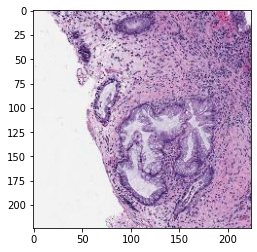

(1545, 224, 224, 3)
(630, 224, 224, 3)
(617, 224, 224, 3)
(360, 224, 224, 3)


In [6]:
import csv
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/1512/Project_B_Supp/mhist_dataset/annotations.csv')

from PIL import Image
# load the image
image = Image.open('/content/drive/MyDrive/Colab Notebooks/1512/Project_B_Supp/mhist_dataset/images/'+'MHIST_aaa.png')
# summarize some details about the image
print(image.format)
print(image.mode)
print(image.size)
# show the image
image.show()

# load and display an image with Matplotlib
from matplotlib import image
from matplotlib import pyplot
# load image as pixel array
data = image.imread('/content/drive/MyDrive/Colab Notebooks/1512/Project_B_Supp/mhist_dataset/images/'+'MHIST_aaa.png')
# summarize shape of the pixel array
print(data.dtype)
print(data.shape)
# display the array of pixels as an image
pyplot.imshow(data)
pyplot.show()

# load all images in a directory
from os import listdir
from matplotlib import image
# load all images in a directory
train_images_SSA = list()
train_images_HP = list()
test_images_SSA = list()
test_images_HP = list()

for filename in listdir('/content/drive/MyDrive/Colab Notebooks/1512/Project_B_Supp/mhist_dataset/images'):
    img_data = image.imread('/content/drive/MyDrive/Colab Notebooks/1512/Project_B_Supp/mhist_dataset/images/' + filename)
    i=df[df['Image Name']==filename]
    if(i['Majority Vote Label'][i.index.values[0]] == 'SSA' and i['Partition'][i.index.values[0]] == 'train'):
        # print('This picture belong to SSA.')
        train_images_SSA.append(img_data)
    elif(i['Majority Vote Label'][i.index.values[0]] == 'SSA' and i['Partition'][i.index.values[0]] == 'test'):
        # print('This picture belong to HP.')
        test_images_SSA.append(img_data)
    elif(i['Majority Vote Label'][i.index.values[0]] == 'HP' and i['Partition'][i.index.values[0]] == 'train'):
        train_images_HP.append(img_data)
    elif(i['Majority Vote Label'][i.index.values[0]] == 'HP' and i['Partition'][i.index.values[0]] == 'test'):
        test_images_HP.append(img_data)


np_train_HP = np.array(train_images_HP)
np_train_SSA = np.array(train_images_SSA)
np_test_HP = np.array(test_images_HP)
np_test_SSA = np.array(test_images_SSA)
print(np_train_HP.shape)
print(np_train_SSA.shape)
print(np_test_HP.shape)
print(np_test_SSA.shape)

np_train_set = np.vstack((np_train_HP,np_train_SSA))
np_train_label = np.vstack((np.zeros([np_train_HP.shape[0],1]),np.ones([np_train_SSA.shape[0],1])))
np_train_label = tensorflow.keras.utils.to_categorical(np_train_label,2)
np_test_set = np.vstack((np_test_HP,np_test_SSA))
np_test_label = np.vstack((np.zeros([np_test_HP.shape[0],1]),np.ones([np_test_SSA.shape[0],1])))
np_test_label = tensorflow.keras.utils.to_categorical(np_test_label,2)
del np_train_HP
del np_train_SSA
del np_test_HP
del np_test_SSA

del train_images_SSA
del train_images_HP
del test_images_SSA
del test_images_HP

In [29]:
train_idx = np.random.permutation(len(np_train_set))
np_train_set,np_train_label = np_train_set[train_idx], np_train_label[train_idx]
# print(np_train_label)

# Model creation

In [44]:
res_model = tensorflow.keras.applications.ResNet50V2(include_top=False,weights="imagenet",input_shape=(224,224,3))
for layer in res_model.layers:
    layer.trainable = False

for i, layer in enumerate(res_model.layers):
    print(i, layer.name, "-", layer.trainable)

mobile_model = tensorflow.keras.applications.mobilenet_v2.MobileNetV2(include_top=False,weights="imagenet",input_shape=(224,224,3))
for layer in mobile_model.layers:
    layer.trainable = False

for i, layer in enumerate(mobile_model.layers):
    print(i, layer.name, "-", layer.trainable)

0 input_1 - False
1 conv1_pad - False
2 conv1_conv - False
3 pool1_pad - False
4 pool1_pool - False
5 conv2_block1_preact_bn - False
6 conv2_block1_preact_relu - False
7 conv2_block1_1_conv - False
8 conv2_block1_1_bn - False
9 conv2_block1_1_relu - False
10 conv2_block1_2_pad - False
11 conv2_block1_2_conv - False
12 conv2_block1_2_bn - False
13 conv2_block1_2_relu - False
14 conv2_block1_0_conv - False
15 conv2_block1_3_conv - False
16 conv2_block1_out - False
17 conv2_block2_preact_bn - False
18 conv2_block2_preact_relu - False
19 conv2_block2_1_conv - False
20 conv2_block2_1_bn - False
21 conv2_block2_1_relu - False
22 conv2_block2_2_pad - False
23 conv2_block2_2_conv - False
24 conv2_block2_2_bn - False
25 conv2_block2_2_relu - False
26 conv2_block2_3_conv - False
27 conv2_block2_out - False
28 conv2_block3_preact_bn - False
29 conv2_block3_preact_relu - False
30 conv2_block3_1_conv - False
31 conv2_block3_1_bn - False
32 conv2_block3_1_relu - False
33 conv2_block3_2_pad - False
3

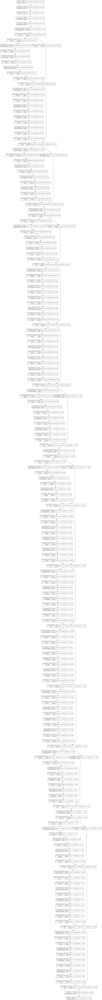

In [45]:
plot_model(res_model, show_shapes=True)

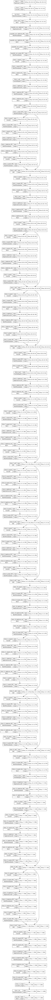

In [46]:
plot_model(mobile_model, show_shapes=True)

In [47]:
def build_HMT_teacher_model_fun(show_summary = 0):

    keras.backend.clear_session()
    # Build CNN teacher.
    hmt_transfer_teacher_model = tf.keras.Sequential(name='HMTteacherNET')

    # your code start from here for stpe 2
    hmt_transfer_teacher_model.add(res_model)


    hmt_transfer_teacher_model.add(Flatten())
    hmt_transfer_teacher_model.add(Dense(2,name='logits'))
    hmt_transfer_teacher_model.add(tf.keras.layers.Activation('softmax', name='softmax'))

    for layer in hmt_transfer_teacher_model.layers:
        if(layer.name == 'resnet50v2'):
            layer.trainable = False

    if(show_summary):
        hmt_transfer_teacher_model.summary()

        for i, layer in enumerate(hmt_transfer_teacher_model.layers):
            print(i, layer.name, "-", layer.trainable)
            

    return hmt_transfer_teacher_model

# hmt_transfer_teacher_model = build_HMT_teacher_model_fun(show_summary = 1)

def build_HMT_teacher_model_fun2(show_summary = 0, my_learning_rate = 0.0001):

    keras.backend.clear_session()
    # Build CNN teacher.
    hmt_transfer_teacher_model = tf.keras.Sequential(name='HMTteacherNET')

    # your code start from here for stpe 2
    hmt_transfer_teacher_model.add(res_model)

    hmt_transfer_teacher_model.add(Flatten())
    hmt_transfer_teacher_model.add(Dense(2,name='logits'))
    hmt_transfer_teacher_model.add(tf.keras.layers.Activation('softmax', name='softmax'))

    for layer in hmt_transfer_teacher_model.layers:
        if(layer.name == 'resnet50v2'):
            layer.trainable = False

    my_optimizer=tensorflow.keras.optimizers.Adam(learning_rate=my_learning_rate)
    my_loss_func=tensorflow.keras.losses.CategoricalCrossentropy()
    hmt_transfer_teacher_model.compile(optimizer=my_optimizer, loss=my_loss_func, metrics=['accuracy'])

    hmt_transfer_teacher_model_logits = tf.keras.Model(inputs=hmt_transfer_teacher_model.input, outputs=hmt_transfer_teacher_model.get_layer('logits').output)

    if(show_summary):
        print('For origin teacher model:')
        hmt_transfer_teacher_model.summary()
        print('\nFor logits teacher model:')
        hmt_transfer_teacher_model_logits.summary()
        for i, layer in enumerate(hmt_transfer_teacher_model.layers):
            print(i, layer.name, "-", layer.trainable)
    

    return hmt_transfer_teacher_model, hmt_transfer_teacher_model_logits

def build_HMT_student_model_fun(show_summary = 0):

    keras.backend.clear_session()
    # Build CNN teacher.
    hmt_student_model = tf.keras.Sequential(name='HMTstudentNET')

    # your code start from here for stpe 2
    hmt_student_model.add(mobile_model)


    hmt_student_model.add(Flatten())
    hmt_student_model.add(Dense(2,name='logits'))
    hmt_student_model.add(tf.keras.layers.Activation('softmax', name='softmax'))

    for layer in hmt_student_model.layers:
        if(layer.name == 'mobilenetv2_1.00_224'):
            layer.trainable = False

    if(show_summary):
        hmt_student_model.summary()

        for i, layer in enumerate(hmt_student_model.layers):
            print(i, layer.name, "-", layer.trainable)

    return hmt_student_model

# hmt_transfer_student_model = build_HMT_student_model_fun(show_summary = 1)

def build_HMT_student_model_fun2(show_summary = 0, my_learning_rate = 0.0001):

    keras.backend.clear_session()
    # Build CNN teacher.
    hmt_student_model = tf.keras.Sequential(name='HMTstudentNET')

    # your code start from here for stpe 2
    hmt_student_model.add(mobile_model)

    hmt_student_model.add(Flatten())
    hmt_student_model.add(Dense(2,name='logits'))
    hmt_student_model.add(tf.keras.layers.Activation('softmax', name='softmax'))

    for layer in hmt_student_model.layers:
        if(layer.name == 'mobilenetv2_1.00_224'):
            layer.trainable = False

    my_optimizer=tensorflow.keras.optimizers.Adam(learning_rate=my_learning_rate)
    my_loss_func=tensorflow.keras.losses.CategoricalCrossentropy()
    hmt_student_model.compile(optimizer=my_optimizer, loss=my_loss_func, metrics=['accuracy'])
    hmt_student_model_logits = tf.keras.Model(inputs=hmt_student_model.input, outputs=hmt_student_model.get_layer('logits').output)

    if(show_summary):
        print('For origin student model:')
        hmt_student_model.summary()
        print('\nFor logits student model:')
        hmt_student_model_logits.summary()
        for i, layer in enumerate(hmt_student_model.layers):
            print(i, layer.name, "-", layer.trainable)

    return hmt_student_model, hmt_student_model_logits

hmt_transfer_teacher_model, hmt_transfer_teacher_model_logits = build_HMT_teacher_model_fun2(show_summary = 1)
hmt_transfer_student_model, hmt_transfer_student_model_logits = build_HMT_student_model_fun2(show_summary = 1)

For origin teacher model:
Model: "HMTteacherNET"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 logits (Dense)              (None, 2)                 200706    
                                                                 
 softmax (Activation)        (None, 2)                 0         
                                                                 
Total params: 23,765,506
Trainable params: 200,706
Non-trainable params: 23,564,800
_________________________________________________________________

For logits teacher model:
Model: "model"
_________________________________________________________________
 Layer (type)                Outp

In [48]:
# plot_model(hmt_transfer_teacher_model, show_shapes=True)

In [49]:
# plot_model(hmt_transfer_student_model, show_shapes=True)

# Teacher loss function

In [13]:
@tf.function
def compute_teacher_loss(images, labels):
    """Compute subclass knowledge distillation teacher loss for given images
        and labels.

    Args:
    images: Tensor representing a batch of images.
    labels: Tensor representing a batch of labels.

    Returns:
    Scalar loss Tensor.
    """
    subclass_logits = cnn_model(images, training=True)

    # Compute cross-entropy loss for subclasses.

    # your code start from here for step 3
    #   print(images)
    #   print(labels)
    #   one_hot_y = tf.one_hot([labels], 10)
    # one_hot_y = tf.one_hot(labels, 10)
    #   print("one_hot_y is:", one_hot_y)
    #   print("subclass_logits is:", subclass_logits)
    #   print("one_hot_y dim is:", one_hot_y.shape)

    #   diff = subclass_logits-one_hot_y
    y_pred = tf.clip_by_value(subclass_logits, 1e-7, 1 - 1e-7)
    cross_entropy_loss_value = -tf.math.reduce_mean(tf.math.reduce_sum(labels * tf.math.log(y_pred), axis=-1, keepdims=False))

    # cross_entropy_loss_value = 1/2 * (subclass_logits-one_hot_y)**2
    # cross_entropy_loss_value = tf.reduce_sum(cross_entropy_loss_value)

    # print("Current subclass_logits is:", subclass_logits)
    # print("Current labels is:", labels)
    # print("Current cross_entropy_loss_value is:", cross_entropy_loss_value)

    return cross_entropy_loss_value

# Student loss function

In [14]:
def softmax_with_temp(logits, temp=1):
    logits = (logits - tf.math.reduce_max(logits)) / temp
    exp_logits = tf.math.exp(logits)
    logits_sum = tf.math.reduce_sum(exp_logits, axis=-1, keepdims=True)
    result = exp_logits / logits_sum
    return result

In [15]:
# #@test {"output": "ignore"}

# Hyperparameters for distillation (need to be tuned).
ALPHA = 0.5 # task balance between cross-entropy and distillation loss
DISTILLATION_TEMPERATURE = 4. #temperature hyperparameter
HMT_BATCH_SIZE = 32
total_train = np_train_set.shape[0]
total_test = np_test_set.shape[0]

def HMT_distillation_loss2(teacher_logits: tf.Tensor, student_logits: tf.Tensor,
                      temperature: Union[float, tf.Tensor]):
  """Compute distillation loss.

  This function computes cross entropy between softened logits and softened
  targets. The resulting loss is scaled by the squared temperature so that
  the gradient magnitude remains approximately constant as the temperature is
  changed. For reference, see Hinton et al., 2014, "Distilling the knowledge in
  a neural network."

  Args:
    teacher_logits: A Tensor of logits provided by the teacher.
    student_logits: A Tensor of logits provided by the student, of the same
      shape as `teacher_logits`.
    temperature: Temperature to use for distillation.

  Returns:
    A scalar Tensor containing the distillation loss.
  """
 # your code start from here for step 3
  soft_targets = softmax_with_temp(teacher_logits,temperature)

  return tf.reduce_mean(
      tf.nn.softmax_cross_entropy_with_logits(
          soft_targets, student_logits / temperature)) * temperature ** 2

def HMT_compute_student_loss(images, labels):
    """Compute subclass knowledge distillation student loss for given images
        and labels.

    Args:
    images: Tensor representing a batch of images.
    labels: Tensor representing a batch of labels.

    Returns:
    Scalar loss Tensor.
    """
    student_subclass_logits_prob = hmt_transfer_student_model(images, training=True)
    student_subclass_logits = hmt_transfer_student_model_logits(images, training=True)

    # Compute subclass distillation loss between student subclass logits and
    # softened teacher subclass targets probabilities.

    # your code start from here for step 3

    teacher_subclass_logits_prob = hmt_transfer_teacher_model(images, training=False)
    teacher_subclass_logits = hmt_transfer_teacher_model_logits(images, training=False)

    distillation_loss_value2 = HMT_distillation_loss2(teacher_subclass_logits, student_subclass_logits, DISTILLATION_TEMPERATURE)

    # Compute cross-entropy loss with hard targets.
    y_pred = tf.clip_by_value(student_subclass_logits_prob, 1e-7, 1 - 1e-7)
    origin_loss = -tf.math.reduce_mean(tf.math.reduce_sum(labels * tf.math.log(y_pred), axis=-1, keepdims=False))
    # your code start from here for step 3

    cross_entropy_loss_value = origin_loss + ALPHA*distillation_loss_value2
    # print("In case of formula 1")
    # weight_cal(origin_loss, ALPHA*distillation_loss_value)
    # print("In case of formula 2")
    # weight_cal(origin_loss, ALPHA*distillation_loss_value2)
    # print("\n")

    return cross_entropy_loss_value

def weight_cal(a,b):
    a = a.numpy()
    b = b.numpy()
    absa = abs(a)
    absb = abs(b)
    print("Origin loss is:", a)
    print("Knowledge distallitation loss is:", b)
    print("Origin loss take %s , and knowledge distallitation take %s weight." % (absa/(absa+absb), absb/(absa+absb)))
    print("And the total loss is:", a+b)
    
    return

# Train and evaluation

In [16]:
@tf.function
def HMT_compute_num_correct(model, images, labels):
    """Compute number of correctly classified images in a batch.

    Args:
    model: Instance of tf.keras.Model.
    images: Tensor representing a batch of images.
    labels: Tensor representing a batch of labels.

    Returns:
    Number of correctly classified images.
    """
    class_logits = model(images, training=False)
    return tf.reduce_sum(
        tf.cast(tf.math.equal(tf.argmax(class_logits, -1), tf.argmax(labels, -1)),
                tf.float32)), tf.argmax(class_logits, -1), tf.argmax(labels, -1)


def HMT_train_and_evaluate(model, compute_loss_fn):
    """Perform training and evaluation for a given model.

    Args:
    model: Instance of tf.keras.Model.
    compute_loss_fn: A function that computes the training loss given the
        images, and labels.
    """

    # your code start from here for step 4
    my_learning_rate = 0.001
    optimizer=tensorflow.keras.optimizers.Adam(learning_rate=my_learning_rate)

    for epoch in range(1, NUM_EPOCHS + 1):
    # Run training.

        print('Epoch {}: '.format(epoch), end='')

        for i in range(total_train//HMT_BATCH_SIZE+1):
            begin_index = i*HMT_BATCH_SIZE
            end_index = (i+1)*HMT_BATCH_SIZE
            if(i==total_train//HMT_BATCH_SIZE):
                end_index = total_train
            images = np_train_set[begin_index:end_index]
            # images = tf.convert_to_tensor(images)
            labels = np_train_label[begin_index:end_index]
            # labels = tf.convert_to_tensor(labels)
            with tf.GradientTape() as tape:
                # your code start from here for step 4

                loss_value = compute_loss_fn(images, labels)

            grads = tape.gradient(loss_value, model.trainable_variables)
            optimizer.apply_gradients(zip(grads, model.trainable_variables))
            # optimizer.apply_gradients(zip(grads, fc_model_logits.trainable_variables))

        # Run evaluation.
        total_num_correct = 0
        num_total = total_test
        for i in range(total_test//HMT_BATCH_SIZE+1):
            begin_index = i*HMT_BATCH_SIZE
            end_index = (i+1)*HMT_BATCH_SIZE
            if(i==total_train//HMT_BATCH_SIZE):
                end_index = total_train
            images = np_test_set[begin_index:end_index,:,:,:]
            labels = np_test_label[begin_index:end_index,:]
            # your code start from here for step 4
            num_correct,_,_ = compute_num_correct(model, images, labels)
            total_num_correct = total_num_correct + num_correct
        print("Class_accuracy: " + '{:.2f}%'.format(
            total_num_correct / num_total * 100))
    return (total_num_correct / num_total * 100)


@tf.function
def hmt_compute_num_correct(model, images, labels):
  """Compute number of correctly classified images in a batch.

  Args:
    model: Instance of tf.keras.Model.
    images: Tensor representing a batch of images.
    labels: Tensor representing a batch of labels.

  Returns:
    Number of correctly classified images.
  """
  class_logits = model(images, training=False)
  return tf.reduce_sum(
      tf.cast(tf.math.equal(tf.argmax(class_logits, -1), tf.argmax(labels, -1)),
              tf.float32)), tf.argmax(class_logits, -1), tf.argmax(labels, -1)

my_batch_size = 32
def hmt_train_and_evaluate(model, compute_loss_fn):
    """Perform training and evaluation for a given model.

    Args:
    model: Instance of tf.keras.Model.
    compute_loss_fn: A function that computes the training loss given the
        images, and labels.
    """
    # tf.enable_eager_execution()
    # your code start from here for step 4
    my_learning_rate = 0.001

    # my_learning_rate=0.001/0.1
    optimizer = tensorflow.keras.optimizers.Adam(learning_rate=my_learning_rate)
    my_batch_size = 15
    NUM_EPOCHS = 12
    for epoch in range(1, NUM_EPOCHS + 1):
        # Run training.
        print('Epoch {}: '.format(epoch), end='')
        x=0
        y=np_train_set.shape[0]//my_batch_size
        for i in range(y):
      
            images=np_train_set[x:x+my_batch_size]
            labels=np_train_label[x:x+my_batch_size]
            # for images, labels in mnist_train:
            with tf.GradientTape() as tape:
                # your code start from here for step 4

                loss_value = compute_loss_fn(images,labels)
                # print('true true')
                # print(loss_value)
                # print(KD_student_model.trainable_variables)
                # loss_value=loss_value.numpy()
            grads = tape.gradient(loss_value, model.trainable_variables)
            # print('gg')

            optimizer.apply_gradients(zip(grads, model.trainable_variables))
            x=x+my_batch_size
        # Run evaluation.
        # num_correct = 0
        # num_total = builder.info.splits['test'].num_examples
        num_total=np_test_set.shape[0]
        total_num_correct=0

    

        xx=0
        # y=np_train_set.shape[0]//my_batch_size
        for i in range(np_test_set.shape[0]//my_batch_size):
            images=np_test_set[xx:xx+my_batch_size]
            labels=np_test_label[xx:xx+my_batch_size]
            # for images, labels in mnist_test:
            # your code start from here for step 4
            # print(compute_num_correct(model,images,labels))
            num_correct,_,_=hmt_compute_num_correct(model,images,labels)
            xx=xx+my_batch_size

            total_num_correct = total_num_correct+num_correct
        print("Class_accuracy: " + '{:.2f}%'.format(
            total_num_correct / num_total * 100))
    
      


    return ((total_num_correct / num_total * 100).numpy())

HMT_BATCH_SIZE = 32
def hmt_train_and_evaluate2(model, compute_loss_fn, NUM_EPOCHS = 12):
    """Perform training and evaluation for a given model.

    Args:
    model: Instance of tf.keras.Model.
    compute_loss_fn: A function that computes the training loss given the
        images, and labels.
    """
    # your code start from here for step 4
    my_learning_rate = 0.0001

    optimizer = tensorflow.keras.optimizers.Adam(learning_rate=my_learning_rate)

    # NUM_EPOCHS = 12
    for epoch in range(1, NUM_EPOCHS + 1):
        # Run training.
        print('Epoch {}: '.format(epoch), end='')

        for i in range(total_train//HMT_BATCH_SIZE+1):
            begin_index = i*HMT_BATCH_SIZE
            end_index = (i+1)*HMT_BATCH_SIZE
            if(i==total_train//HMT_BATCH_SIZE):
                end_index = total_train
            images = np_train_set[begin_index:end_index]
            labels = np_train_label[begin_index:end_index]
            with tf.GradientTape() as tape:
                # your code start from here for step 4
                loss_value = compute_loss_fn(images,labels)
                # print('Current input image shape is: ', images.shape)
                # print("Current loss value is:", loss_value.numpy())
                # print("Current trainable_variables are: ", model.trainable_variables)
            grads = tape.gradient(loss_value, model.trainable_variables)
            optimizer.apply_gradients(zip(grads, model.trainable_variables))
        num_total=np_test_set.shape[0]
        total_num_correct=0

    

        total_num_correct = 0
        num_total = total_test
        for i in range(total_test//HMT_BATCH_SIZE+1):
            begin_index = i*HMT_BATCH_SIZE
            end_index = (i+1)*HMT_BATCH_SIZE
            if(i==total_test//HMT_BATCH_SIZE):
                end_index = total_test
            images = np_test_set[begin_index:end_index,:,:,:]
            labels = np_test_label[begin_index:end_index,:]
            num_correct,_,_=hmt_compute_num_correct(model,images,labels)
            total_num_correct = total_num_correct+num_correct
        print("Class_accuracy: " + '{:.2f}%'.format(
            total_num_correct / num_total * 100))
    
      


    return ((total_num_correct / num_total * 100).numpy())

HMT_BATCH_SIZE = 32
def hmt_train_and_evaluate3(model, compute_loss_fn, NUM_EPOCHS = 12):
    """Perform training and evaluation for a given model.

    Args:
    model: Instance of tf.keras.Model.
    compute_loss_fn: A function that computes the training loss given the
        images, and labels.
    """
    # your code start from here for step 4
    my_learning_rate = 0.0001

    optimizer = tensorflow.keras.optimizers.Adam(learning_rate=my_learning_rate)

    # NUM_EPOCHS = 12
    for epoch in range(1, NUM_EPOCHS + 1):
        # Run training.
        print('Epoch {}: '.format(epoch), end='')

        for i in range(total_train//HMT_BATCH_SIZE+1):
            begin_index = i*HMT_BATCH_SIZE
            end_index = (i+1)*HMT_BATCH_SIZE
            if(i==total_train//HMT_BATCH_SIZE):
                end_index = total_train
            images = np_train_set[begin_index:end_index]
            labels = np_train_label[begin_index:end_index]
            with tf.GradientTape() as tape:
                # your code start from here for step 4
                loss_value = compute_loss_fn(images,labels)
                # print('Current input image shape is: ', images.shape)
                # print("Current loss value is:", loss_value.numpy())
                # print("Current trainable_variables are: ", model.trainable_variables)
            grads = tape.gradient(loss_value, model.trainable_variables)
            optimizer.apply_gradients(zip(grads, model.trainable_variables))
        num_total=np_test_set.shape[0]
        total_num_correct=0

        num_total = total_test

        num_correct,_,_=hmt_compute_num_correct(model,np_test_set,np_test_label)
        print("Class_accuracy: " + '{:.2f}%'.format(
            num_correct / num_total * 100))

    return ((total_num_correct / num_total * 100).numpy())

In [17]:
def evaluate_accuracy(model, dataset, labelset):
    total_num_correct = 0
    num_total = dataset.shape[0]
    for index in range(dataset.shape[0]):
        input = dataset[index]
        label = np.argmax(labelset[index])
        pred_label = np.argmax(model(np.expand_dims(np.expand_dims(input, axis=0), axis=-1)).numpy())
        if(pred_label == label):
            total_num_correct = total_num_correct + 1
    print("Set_accuracy: " + '{:.2f}%'.format(total_num_correct / num_total * 100))
    return (total_num_correct / num_total * 100)

def evaluate_accuracy2(model, dataset, labelset, batch_size = 32):
    total_num_correct = 0
    num_total = dataset.shape[0]
    for i in range(num_total//batch_size+1):
        begin_index = i*batch_size
        end_index = (i+1)*batch_size
        if(i==num_total//batch_size):
            end_index = num_total
        images = dataset[begin_index:end_index]
        # images = tf.convert_to_tensor(images)
        labels = dataset[begin_index:end_index]
        # labels = tf.convert_to_tensor(labels)
        # your code start from here for step 4
        num_correct,_,_ = compute_num_correct(model, images, labels)
        num_correct = num_correct.np()
        total_num_correct = total_num_correct + num_correct
    acc = total_num_correct / num_total * 100
    return acc

def evaluate_accuracy3(model, dataset, labelset):
    total_num_correct = 0
    num_total = dataset.shape[0]
    num_correct,_,_ = compute_num_correct(model, dataset, labelset)
    acc = num_correct / num_total * 100
    return acc

def compute_num_correct(model, images, labels):
    """Compute number of correctly classified images in a batch.

    Args:
    model: Instance of tf.keras.Model.
    images: Tensor representing a batch of images.
    labels: Tensor representing a batch of labels.

    Returns:
    Number of correctly classified images.
    """
    class_logits = model(images, training=False)
    return tf.reduce_sum(
        tf.cast(tf.math.equal(tf.argmax(class_logits, -1), tf.argmax(labels, -1)),
                tf.float32)), tf.argmax(class_logits, -1), tf.argmax(labels, -1)

# Training models

In [18]:
# your code start from here for step 5 
log_dir2="logs/fit/HMT_teacher" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback2 = tensorflow.keras.callbacks.TensorBoard(log_dir=log_dir2, histogram_freq=1)

In [19]:
hmt_transfer_teacher_model, hmt_transfer_teacher_model_logits = build_HMT_teacher_model_fun2()
hmt_transfer_student_model, hmt_transfer_student_model_logits = build_HMT_student_model_fun2()

history = hmt_transfer_teacher_model.fit(x = np_train_set, y = np_train_label, batch_size = 32, epochs = 6, callbacks=[tensorboard_callback2])
t_acc = evaluate_accuracy3(hmt_transfer_teacher_model, np_test_set, np_test_label)
s_acc = hmt_train_and_evaluate2(hmt_transfer_student_model, HMT_compute_student_loss, NUM_EPOCHS=8)
print('Teacher accuracy is %s and student accuracy is %s.'%(t_acc.numpy(), s_acc))

Epoch 1/6
68/68 [==============================] - 17s 102ms/step - loss: 0.6629 - accuracy: 0.7664
Epoch 2/6
68/68 [==============================] - 7s 97ms/step - loss: 0.1936 - accuracy: 0.9200
Epoch 3/6
68/68 [==============================] - 7s 97ms/step - loss: 0.0756 - accuracy: 0.9830
Epoch 4/6
68/68 [==============================] - 7s 97ms/step - loss: 0.0404 - accuracy: 0.9995
Epoch 5/6
68/68 [==============================] - 7s 97ms/step - loss: 0.0220 - accuracy: 1.0000
Epoch 6/6
68/68 [==============================] - 6s 95ms/step - loss: 0.0157 - accuracy: 1.0000
Epoch 1: Class_accuracy: 58.34%
Epoch 2: Class_accuracy: 74.00%
Epoch 3: Class_accuracy: 74.62%
Epoch 4: Class_accuracy: 74.72%
Epoch 5: Class_accuracy: 73.69%
Epoch 6: Class_accuracy: 73.29%
Epoch 7: Class_accuracy: 73.18%
Epoch 8: Class_accuracy: 73.80%
Teacher accuracy is 79.63152 and student accuracy is 73.79734.


In [20]:
print('Teacher accuracy is %s and student accuracy is %s.'%(t_acc.numpy(), s_acc))

Teacher accuracy is 79.63152 and student accuracy is 73.79734.


# Test accuracy vs. tempreture curve

In [ ]:
# your code start from here for step 6
temperature_array = [1.,2.,4.,8.,16.,32.,64.]
class_accuracy_array = []
for t in temperature_array:
    DISTILLATION_TEMPERATURE = t
    hmt_transfer_student_model, hmt_transfer_student_model_logits = build_HMT_student_model_fun2()
    acc = hmt_train_and_evaluate2(hmt_transfer_student_model, HMT_compute_student_loss, NUM_EPOCHS=8)
    print("In temperature = %s, accuracy after 12 epoch is: %s." %(t,acc))
    class_accuracy_array.append(acc)

Epoch 1: Class_accuracy: 36.85%
Epoch 2: Class_accuracy: 50.77%
Epoch 3: Class_accuracy: 47.08%
Epoch 4: Class_accuracy: 52.20%
Epoch 5: Class_accuracy: 54.15%
Epoch 6: Class_accuracy: 55.78%
Epoch 7: Class_accuracy: 57.93%
Epoch 8: Class_accuracy: 59.98%
In temperature = 1.0, accuracy after 12 epoch is: 59.979527.
Epoch 1: Class_accuracy: 36.85%
Epoch 2: Class_accuracy: 36.85%
Epoch 3: Class_accuracy: 43.30%
Epoch 4: Class_accuracy: 47.49%
Epoch 5: Class_accuracy: 50.56%
Epoch 6: Class_accuracy: 52.61%
Epoch 7: Class_accuracy: 54.76%
Epoch 8: Class_accuracy: 54.86%
In temperature = 2.0, accuracy after 12 epoch is: 54.86182.
Epoch 1: Class_accuracy: 69.91%
Epoch 2: Class_accuracy: 72.36%
Epoch 3: Class_accuracy: 73.90%
Epoch 4: Class_accuracy: 74.00%
Epoch 5: Class_accuracy: 72.47%
Epoch 6: Class_accuracy: 72.36%
Epoch 7: Class_accuracy: 72.26%
Epoch 8: Class_accuracy: 72.88%
In temperature = 4.0, accuracy after 12 epoch is: 72.87615.
Epoch 1: Class_accuracy: 45.75%
Epoch 2: Class_accu

[59.979527 54.86182  72.87615  71.033775 68.16786  69.70317  69.293755]


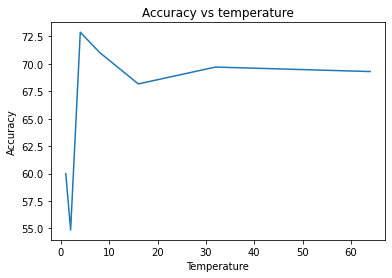

In [ ]:
class_accuracy_array_np = np.array(class_accuracy_array)
print(class_accuracy_array_np)
plt.plot(temperature_array, class_accuracy_array_np)
plt.title("Accuracy vs temperature")
plt.xlabel('Temperature')
plt.ylabel('Accuracy')
plt.show()

# Train student from scratch

In [21]:
hmt_transfer_student_model_no_distillation, _ = build_HMT_student_model_fun2()
hmt_transfer_student_model_no_distillation.fit(x = np_train_set, y = np_train_label, batch_size = 32, epochs = 8, callbacks=[tensorboard_callback2])
s_wKD_acc = evaluate_accuracy3(hmt_transfer_student_model_no_distillation, np_test_set, np_test_label)
print('Student without KD accuracy is %s.'%(s_wKD_acc.numpy()))

Epoch 1/8
68/68 [==============================] - 5s 48ms/step - loss: 0.6169 - accuracy: 0.7577
Epoch 2/8
68/68 [==============================] - 3s 46ms/step - loss: 0.2495 - accuracy: 0.8952
Epoch 3/8
68/68 [==============================] - 3s 48ms/step - loss: 0.1343 - accuracy: 0.9554
Epoch 4/8
68/68 [==============================] - 3s 47ms/step - loss: 0.0792 - accuracy: 0.9811
Epoch 5/8
68/68 [==============================] - 3s 47ms/step - loss: 0.0469 - accuracy: 0.9977
Epoch 6/8
68/68 [==============================] - 3s 47ms/step - loss: 0.0329 - accuracy: 0.9995
Epoch 7/8
68/68 [==============================] - 3s 47ms/step - loss: 0.0254 - accuracy: 1.0000
Epoch 8/8
68/68 [==============================] - 3s 46ms/step - loss: 0.0191 - accuracy: 1.0000
Student without KD accuracy is 77.6868.


In [34]:
hmt_transfer_student_model_no_distillation2, hmt_transfer_student_model_logits = build_HMT_student_model_fun2()
## @test {"output": "ignore"}

def HMT_compute_plain_cross_entropy_loss(images, labels):
    """Compute plain loss for given images and labels.

    For fair comparison and convenience, this function also performs a
    LogSumExp over subclasses, but does not perform subclass distillation.

    Args:
    images: Tensor representing a batch of images.
    labels: Tensor representing a batch of labels.

    Returns:
    Scalar loss Tensor.
    """
    # your code start from here for step 7

    student_subclass_logits_prob = hmt_transfer_student_model_no_distillation(images, training=True)

    # Compute cross-entropy loss with hard targets.
    y_pred = tf.clip_by_value(student_subclass_logits_prob, 1e-7, 1 - 1e-7)
    origin_loss = -tf.math.reduce_mean(tf.math.reduce_sum(labels * tf.math.log(y_pred), axis=-1, keepdims=False))
    # your code start from here for step 3

    cross_entropy_loss_value = origin_loss

    return cross_entropy_loss_value

ALPHA = 0.0
# s_wKD_acc2 = hmt_train_and_evaluate2(hmt_transfer_student_model_no_distillation2, HMT_compute_plain_cross_entropy_loss, NUM_EPOCHS=8)
s_wKD_acc2 = hmt_train_and_evaluate2(hmt_transfer_student_model_no_distillation2, HMT_compute_student_loss, NUM_EPOCHS=8)
ALPHA = 0.5
print('Student without KD accuracy is %s.'%(s_wKD_acc2))

Epoch 1: Class_accuracy: 44.22%
Epoch 2: Class_accuracy: 44.22%
Epoch 3: Class_accuracy: 44.22%
Epoch 4: Class_accuracy: 44.22%
Epoch 5: Class_accuracy: 44.22%
Epoch 6: Class_accuracy: 44.22%
Epoch 7: Class_accuracy: 44.22%
Epoch 8: Class_accuracy: 44.22%
Student without KD accuracy is 44.21699.


# Comparing the teacher and student model (number of of parameters and FLOPs) 

In [32]:
# your code start from here for step 8
print("For teacher model:")
flops = get_flops(hmt_transfer_teacher_model, batch_size = 1)
print(f"FLOPS: {flops / 10 ** 9:.03}G")
print("For student model:")
flops = get_flops(hmt_transfer_student_model, batch_size = 1)
print(f"FLOPS: {flops / 10 ** 9:.03}G")
print("For student model without distillation:")
flops = get_flops(hmt_transfer_student_model_no_distillation, batch_size = 1)
print(f"FLOPS: {flops / 10 ** 9:.03}G")

For teacher model:
FLOPS: 6.99G
For student model:
FLOPS: 0.613G
For student model without distillation:
FLOPS: 0.613G


# XAI method to explain models

In [35]:
# your code start from here for step 9
%load_ext autoreload
%autoreload 2
from xai_utils import *


True label:  1
Teacher predicted_label:  1
Teacher confidence score for the correct label: 0.99919003
Student predicted_label:  1
Student confidence score for the correct label: 0.9313379
Student no distillation predicted_label:  1
Student no distillation confidence score for the correct label: 0.997391


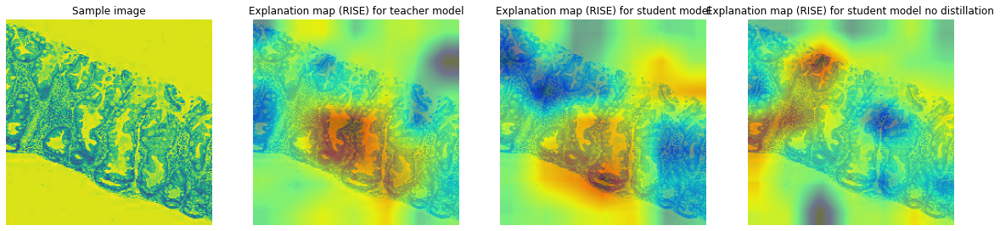

In [36]:
def my_HMT_XAI_test(image_batch, label_batch, index, model1 = hmt_transfer_teacher_model, model2 = hmt_transfer_student_model, model3 = hmt_transfer_student_model_no_distillation):

    prediction=model1(image_batch)
    prediction_2=model2(image_batch)
    prediction_3=model3(image_batch)
    print('True label: ',np.argmax(label_batch[index]))
    print('Teacher predicted_label: ',np.argmax(prediction[index]))
    print('Teacher confidence score for the correct label: '+str(prediction[index][np.argmax(label_batch[index])].numpy()))
    print('Student predicted_label: ',np.argmax(prediction_2[index]))
    print('Student confidence score for the correct label: '+str(prediction_2[index][np.argmax(label_batch[index])].numpy()))
    print('Student no distillation predicted_label: ',np.argmax(prediction_3[index]))
    print('Student no distillation confidence score for the correct label: '+str(prediction_3[index][np.argmax(label_batch[index])].numpy()))

    explanation_map_RISE = RISE(image_batch[index], model1, class_index=np.argmax(prediction[index]) ,N_MASKS=1000, H = 224, W = 224, C = 3)
    explanation_map_RISE -= explanation_map_RISE.min()
    explanation_map_RISE /= explanation_map_RISE.max()+10e-30

    explanation_map_RISE_2 = RISE(image_batch[index], model2, class_index=np.argmax(prediction[index]) ,N_MASKS=1000, H = 224, W = 224, C = 3)
    explanation_map_RISE_2 -= explanation_map_RISE_2.min()
    explanation_map_RISE_2 /= explanation_map_RISE_2.max()+10e-30

    explanation_map_RISE_3 = RISE(image_batch[index], model3, class_index=np.argmax(prediction[index]) ,N_MASKS=1000, H = 224, W = 224, C = 3)
    explanation_map_RISE_3 -= explanation_map_RISE_3.min()
    explanation_map_RISE_3 /= explanation_map_RISE_3.max()+10e-30

    plt.figure(figsize=(20,5))

    plt.subplot(1,4,1)
    plt.imshow(image_batch[index,:,:,0])
    plt.axis('off')
    plt.title('Sample image')

    plt.subplot(1,4,2)
    plt.imshow(image_batch[index,:,:,0])
    plt.imshow(explanation_map_RISE, cmap='jet', alpha=0.5)
    plt.axis('off')
    plt.title('Explanation map (RISE) for teacher model')

    plt.subplot(1,4,3)
    plt.imshow(image_batch[index,:,:,0])
    plt.imshow(explanation_map_RISE_2, cmap='jet', alpha=0.5)
    plt.axis('off')
    plt.title('Explanation map (RISE) for student model')

    plt.subplot(1,4,4)
    plt.imshow(image_batch[index,:,:,0])
    plt.imshow(explanation_map_RISE_3, cmap='jet', alpha=0.5)
    plt.axis('off')
    plt.title('Explanation map (RISE) for student model no distillation')

my_HMT_XAI_test(np_train_set[0:10,:,:,:], np_train_label[0:10,:], 3)

True label:  1
Teacher predicted_label:  1
Teacher confidence score for the correct label: 0.99984527
Student predicted_label:  1
Student confidence score for the correct label: 0.9888342
Student no distillation predicted_label:  1
Student no distillation confidence score for the correct label: 0.9963217
True label:  0
Teacher predicted_label:  0
Teacher confidence score for the correct label: 0.99994063
Student predicted_label:  0
Student confidence score for the correct label: 0.99983895
Student no distillation predicted_label:  0
Student no distillation confidence score for the correct label: 0.99990237
True label:  1
Teacher predicted_label:  1
Teacher confidence score for the correct label: 0.90778226
Student predicted_label:  0
Student confidence score for the correct label: 0.03808604
Student no distillation predicted_label:  1
Student no distillation confidence score for the correct label: 0.94336426
True label:  0
Teacher predicted_label:  0
Teacher confidence score for the co

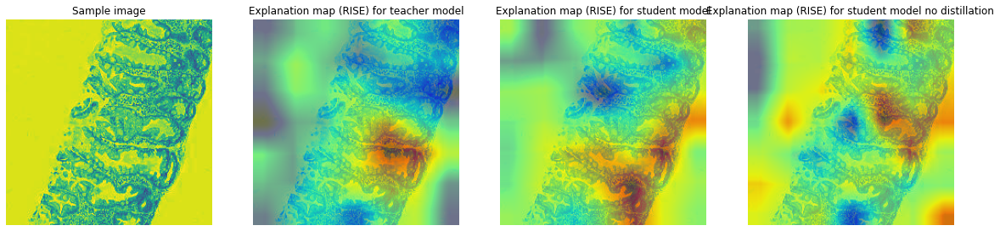

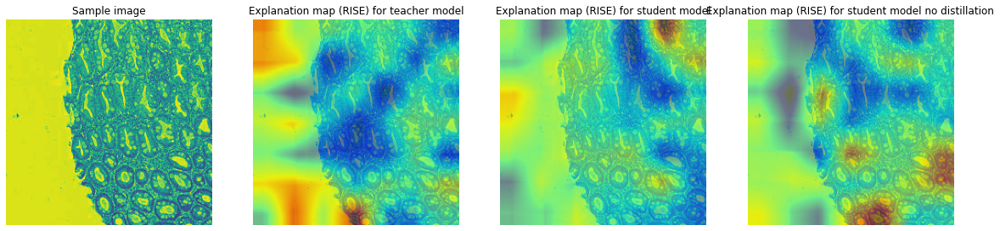

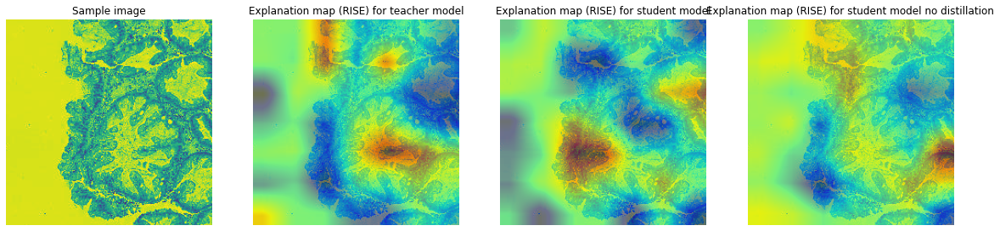

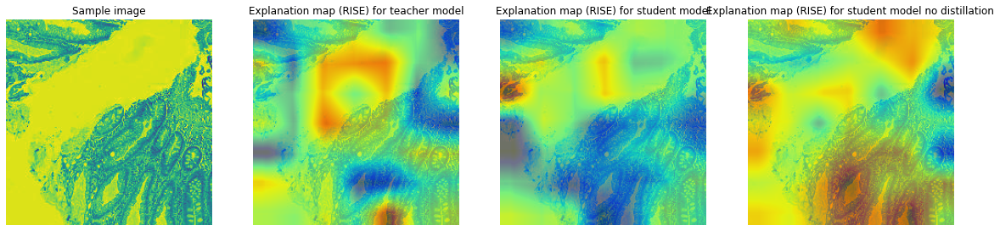

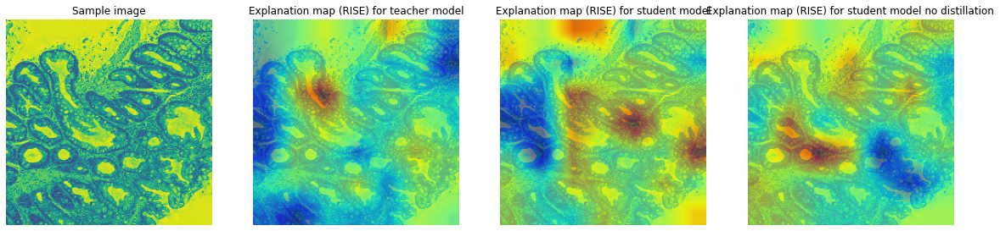

In [37]:
for index in range(5):
    my_HMT_XAI_test(np_train_set[100:110,:,:,:], np_train_label[100:110,:], index)

True label:  1
Teacher predicted_label:  1
Teacher confidence score for the correct label: 0.97148246
Student predicted_label:  1
Student confidence score for the correct label: 0.98983496
Student no distillation predicted_label:  1
Student no distillation confidence score for the correct label: 0.9906517
True label:  0
Teacher predicted_label:  0
Teacher confidence score for the correct label: 0.99759895
Student predicted_label:  0
Student confidence score for the correct label: 0.880637
Student no distillation predicted_label:  0
Student no distillation confidence score for the correct label: 0.9973152
True label:  0
Teacher predicted_label:  0
Teacher confidence score for the correct label: 0.9999924
Student predicted_label:  0
Student confidence score for the correct label: 0.9999882
Student no distillation predicted_label:  0
Student no distillation confidence score for the correct label: 0.9999722
True label:  1
Teacher predicted_label:  1
Teacher confidence score for the correct

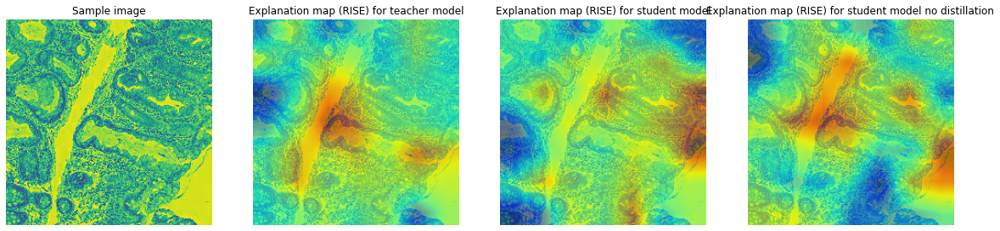

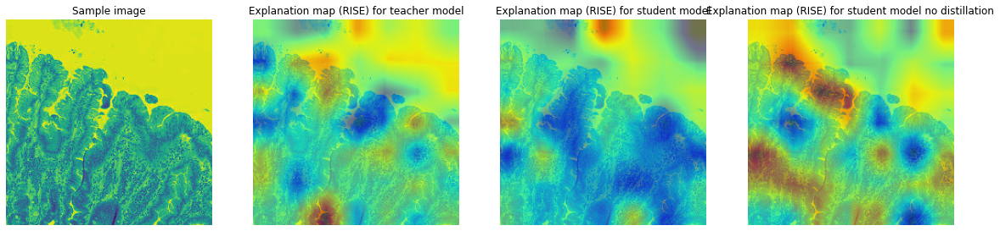

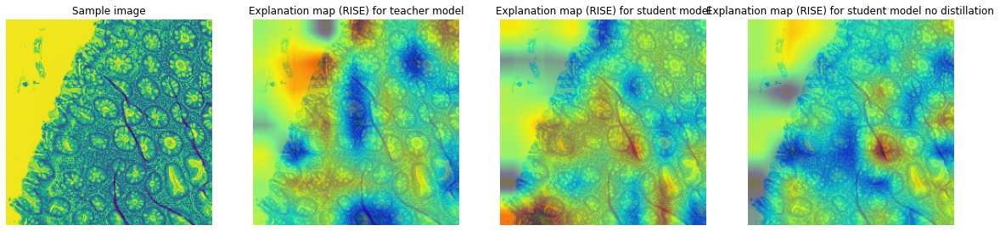

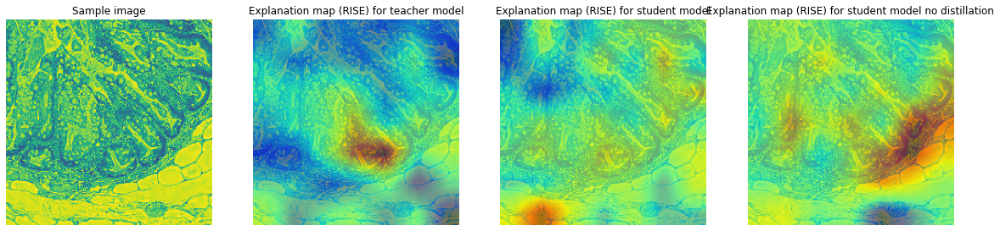

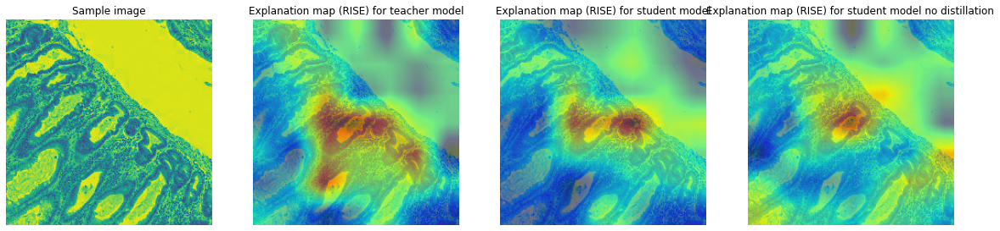

In [38]:
for index in range(5):
    my_HMT_XAI_test(np_train_set[200:210,:,:,:], np_train_label[200:210,:], index)

# Implementing the state-of-the-art KD algorithm

In [39]:
epoch_array = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]

hmt_transfer_teacher_model_acc = []
hmt_transfer_student_model_acc = []

for epoch_num in epoch_array:
    hmt_transfer_teacher_model, hmt_transfer_teacher_model_logits = build_HMT_teacher_model_fun2()
    hmt_transfer_student_model, hmt_transfer_student_model_logits = build_HMT_student_model_fun2()

    history = hmt_transfer_teacher_model.fit(x = np_train_set, y = np_train_label, batch_size = 32, epochs = epoch_num, callbacks=[tensorboard_callback2])
    teacher_test_acc = evaluate_accuracy3(hmt_transfer_teacher_model, np_test_set, np_test_label)
    student_test_acc = hmt_train_and_evaluate2(hmt_transfer_student_model, HMT_compute_student_loss, NUM_EPOCHS=8)
    hmt_transfer_teacher_model_acc.append(teacher_test_acc)
    hmt_transfer_student_model_acc.append(student_test_acc)

68/68 [==============================] - 9s 93ms/step - loss: 0.7105 - accuracy: 0.7457
Epoch 1: Class_accuracy: 77.48%
Epoch 2: Class_accuracy: 78.10%
Epoch 3: Class_accuracy: 75.74%
Epoch 4: Class_accuracy: 73.29%
Epoch 5: Class_accuracy: 75.64%
Epoch 6: Class_accuracy: 74.31%
Epoch 7: Class_accuracy: 73.18%
Epoch 8: Class_accuracy: 68.37%
Epoch 1/2
68/68 [==============================] - 9s 93ms/step - loss: 0.6959 - accuracy: 0.7411
Epoch 2/2
68/68 [==============================] - 6s 93ms/step - loss: 0.1964 - accuracy: 0.9228
Epoch 1: Class_accuracy: 76.56%
Epoch 2: Class_accuracy: 76.66%
Epoch 3: Class_accuracy: 76.56%
Epoch 4: Class_accuracy: 76.97%
Epoch 5: Class_accuracy: 70.83%
Epoch 6: Class_accuracy: 78.20%
Epoch 7: Class_accuracy: 74.41%
Epoch 8: Class_accuracy: 73.18%
Epoch 1/3
68/68 [==============================] - 9s 93ms/step - loss: 0.6551 - accuracy: 0.7600
Epoch 2/3
68/68 [==============================] - 6s 93ms/step - loss: 0.1675 - accuracy: 0.9324
Epoch 3/

[76.66325  77.175026 79.32446  79.529175 79.32446  79.63152  80.85977
 78.60798  81.16684  80.24565  80.24565  79.73388  79.42682  81.98567
 81.4739   79.529175 79.529175 81.371544 81.78097  80.450356 80.65507
 80.85977  80.65507  80.348    79.63152 ]
[68.372574 73.18321  77.58444  67.04196  67.14432  77.07268  68.27021
 71.95496  66.325485 70.419655 66.018425 68.47492  67.96315  71.95496
 68.986694 71.34084  73.387924 69.1914   67.553734 70.21494  76.560905
 72.36438  69.70317  72.05732  76.04913 ]


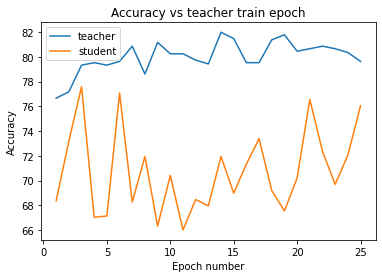

In [40]:
np_hmt_transfer_teacher_model_acc = np.array(hmt_transfer_teacher_model_acc)
print(np_hmt_transfer_teacher_model_acc)
np_hmt_transfer_student_model_acc = np.array(hmt_transfer_student_model_acc)
print(np_hmt_transfer_student_model_acc)

plt.plot(epoch_array, hmt_transfer_teacher_model_acc, label = 'teacher')
plt.plot(epoch_array, hmt_transfer_student_model_acc, label = 'student')
plt.legend()
plt.title("Accuracy vs teacher train epoch")
plt.xlabel('Epoch number')
plt.ylabel('Accuracy')
plt.show()